# **Image Segmentation and Maskrcnn**

In [ ]:
# 1= Perform basic color-based segmentation to separate the blue color in an image

import cv2
import numpy as np

# Load the image
image = cv2.imread('/content/my_img.jpg')






In [ ]:
# Convert the image to HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

In [ ]:
# Define the range of blue color
lower_blue = np.array([100, 50, 50])
upper_blue = np.array([130, 255, 255])

In [ ]:
# Perform color-based segmentation
mask = cv2.inRange(hsv_image, lower_blue, upper_blue)

In [ ]:
# Apply the mask to the original image
blue_image = cv2.bitwise_and(image, image, mask=mask)

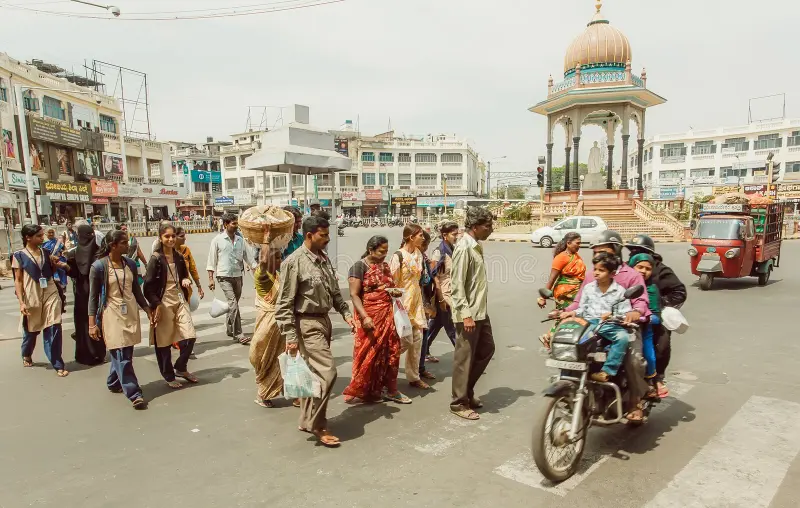

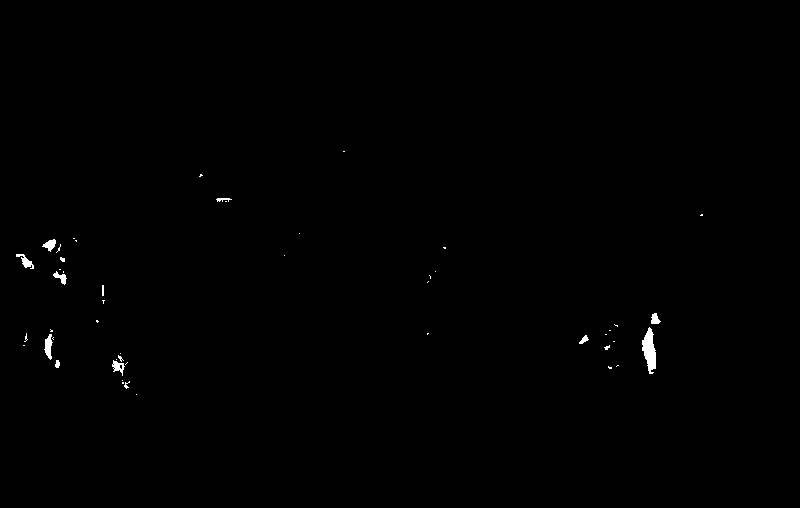

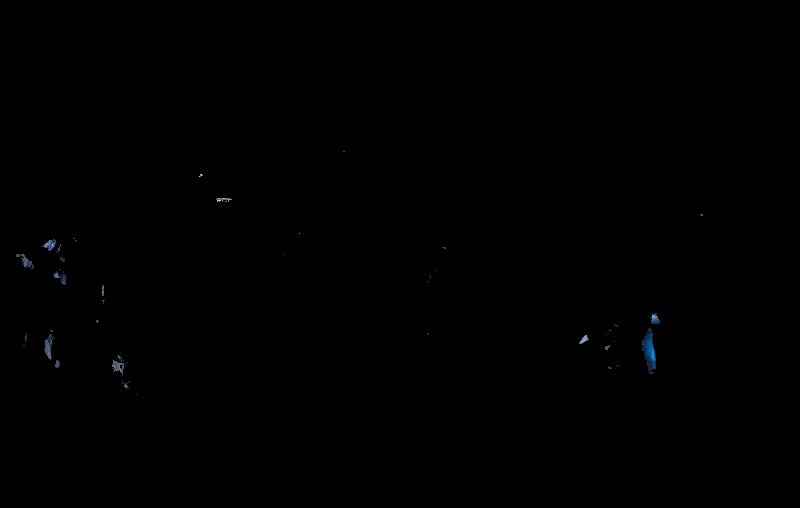

In [ ]:
  # Display the results
from google.colab.patches import cv2_imshow
cv2_imshow(image)
cv2_imshow(mask)
cv2_imshow(blue_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
# 2= Use edge detection with Canny to highlight object edges in an image loaded

import cv2

# Load the image
image = cv2.imread('/content/selective-closeup-cute-kitten-floor_1.JPG')

In [ ]:
# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:
# Apply Canny Edge Detection
edges = cv2.Canny(gray_image, 100, 200)

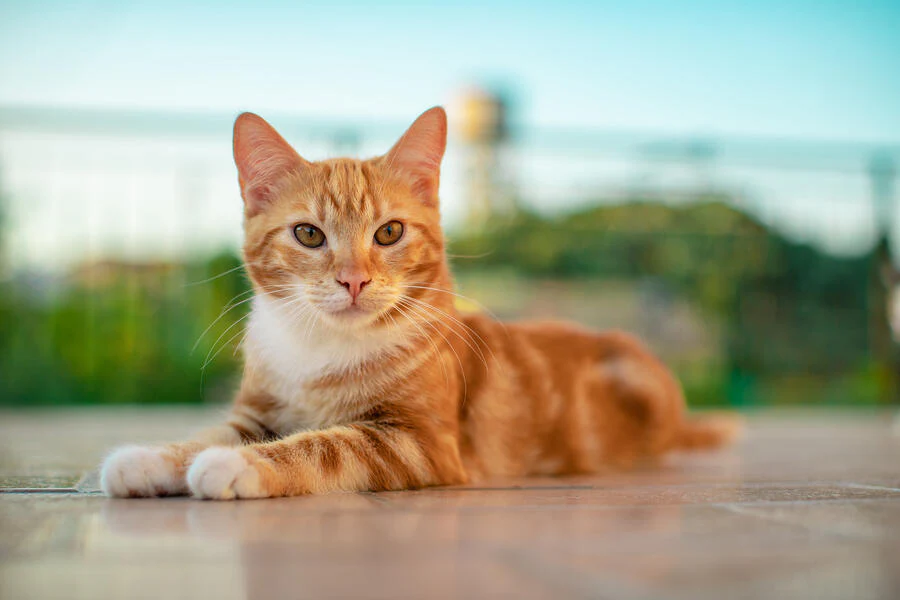

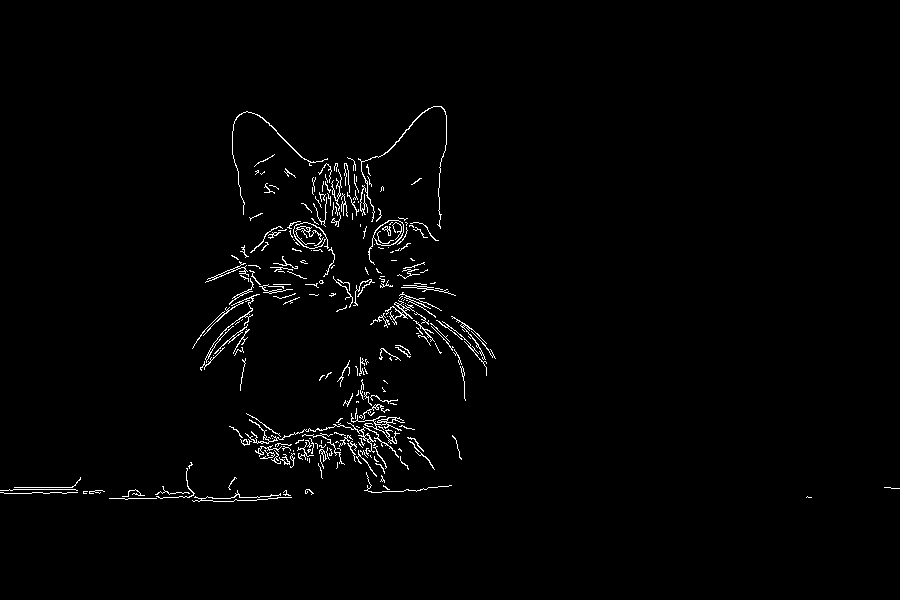

In [ ]:
cv2_imshow(image)
cv2_imshow(edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [14]:
# = Load a pretrained Mask R-CNN model from PyTorch and use it for object detection and segmentation on an image
import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from google.colab.patches import cv2_imshow

# Load pre-trained model and its weights
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Set the model to evaluation mode
model.eval()

# Move the model to the GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Load the image
img_path = '/content/-1x-1.jpg'  # replace with your image path
img = Image.open(img_path)

# # Preprocess the image
transform = transforms.Compose([transforms.ToTensor()])
img_tensor = transform(img)

# # Add batch dimension
img_tensor = img_tensor.unsqueeze(0)

# # Move the image tensor to the GPU if available
img_tensor = img_tensor.to(device)

# # Perform object detection
outputs = model(img_tensor)

# # Get the scores, class labels, and boxes
scores = outputs[0]['scores'].detach().cpu().numpy()
labels = outputs[0]['labels'].detach().cpu().numpy()
boxes = outputs[0]['boxes'].detach().cpu().numpy()




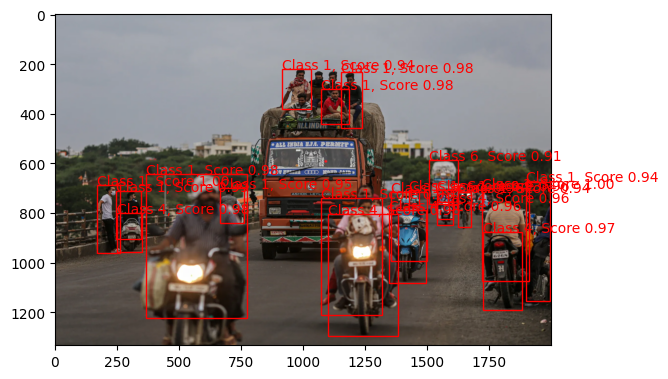

In [16]:
# Generate bounding boxes for each object detected by Mask R-CNN in an image


fig, ax = plt.subplots()

# # Display the image
ax.imshow(img)

# # Iterate over the detected objects
for i, (score, label, box) in enumerate(zip(scores, labels, boxes)):
    # Filter out objects with low scores
    if score < 0.9:
        continue

#     # Create a rectangle patch for the bounding box
    rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

    # Display the class label and score
    ax.text(box[0], box[1], f'Class {label}, Score {score:.2f}', color='red')

plt.show()

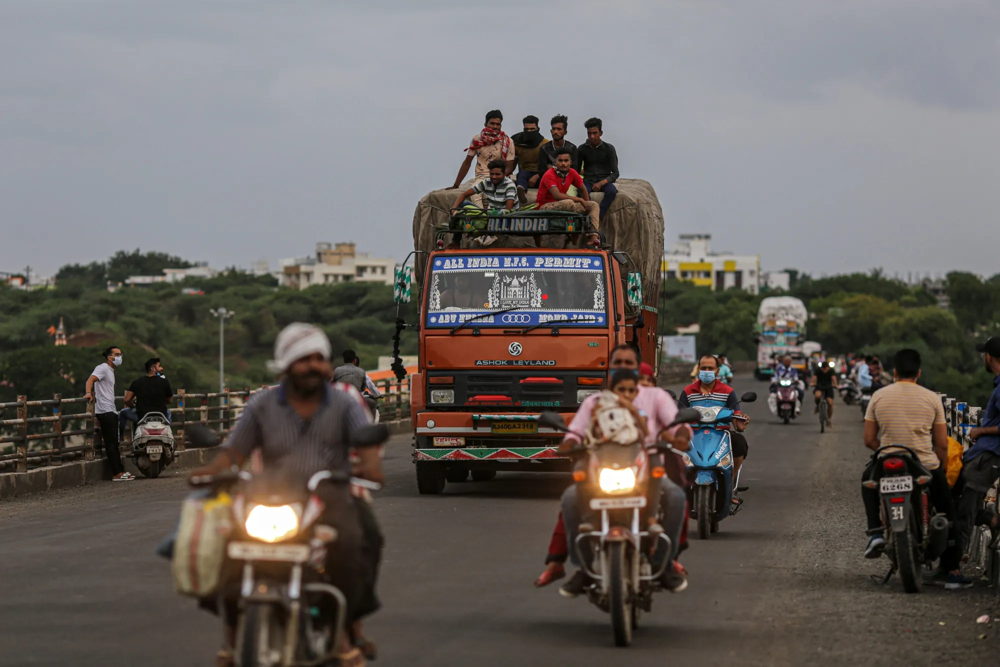

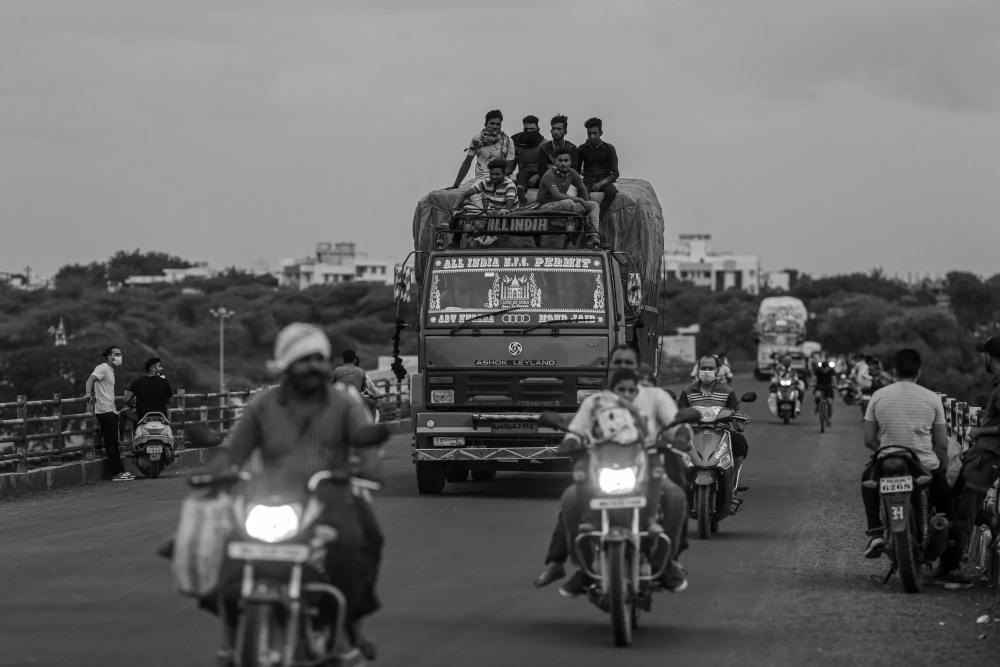

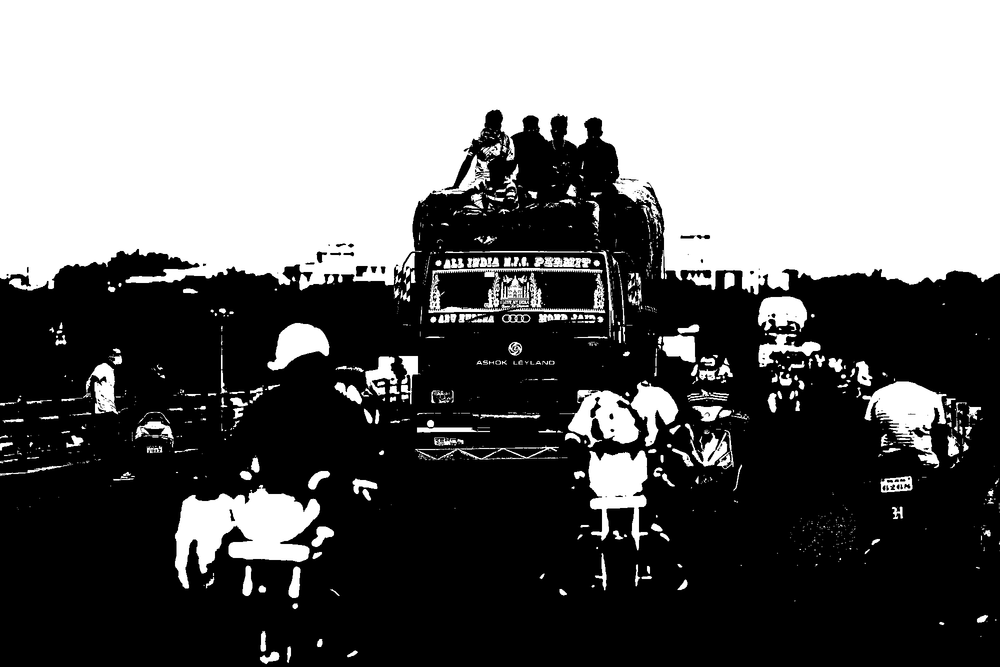

In [20]:
#  Convert an image to grayscale and apply Otsu's thresholding method for segmentation=

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/-1x-1.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Otsu's thresholding
ret, thresholded_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display the results
cv2_imshow(image)
cv2_imshow(gray_image)
cv2_imshow(thresholded_image)


cv2.waitKey(0)
cv2.destroyAllWindows()

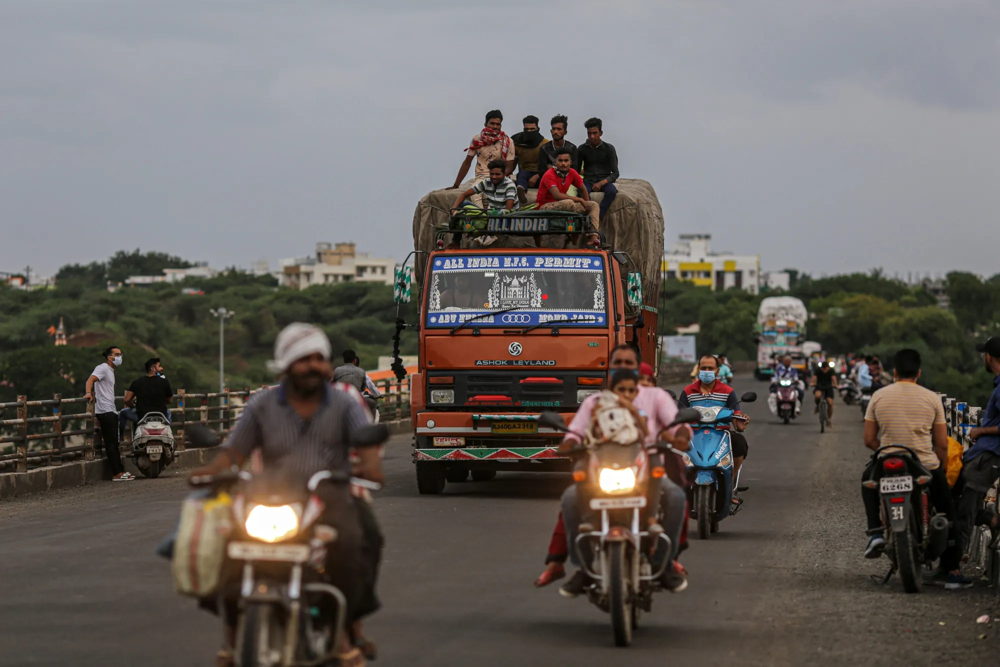

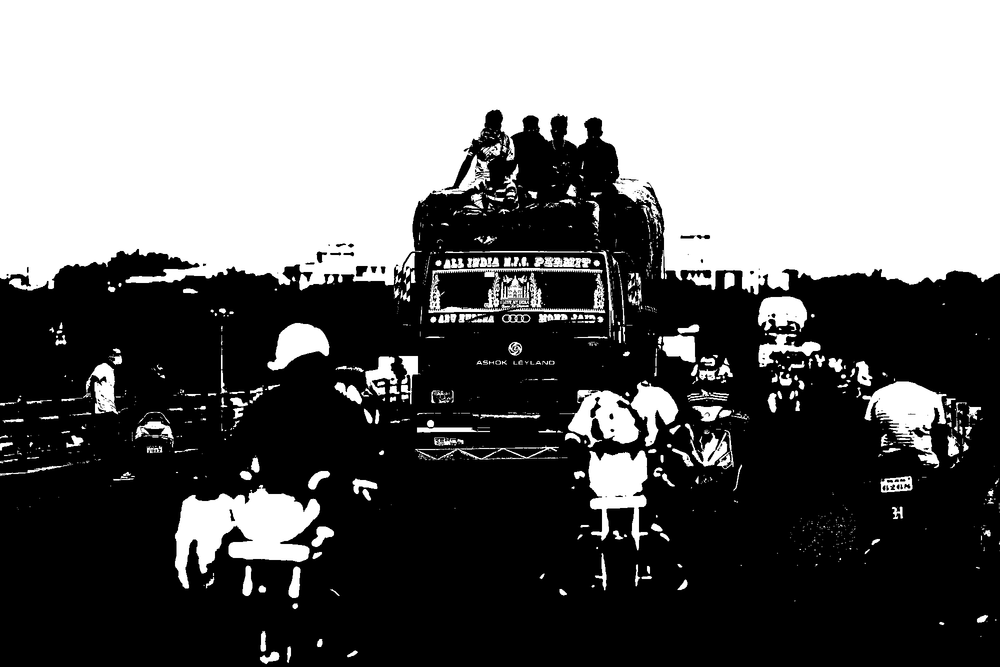

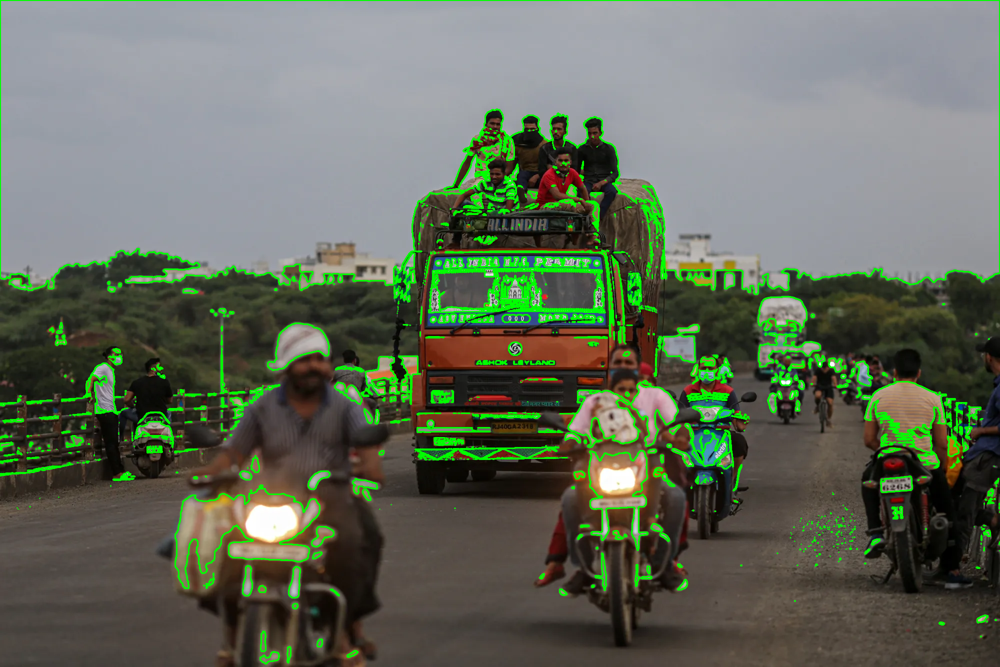

In [21]:
#  Perform contour detection in an image to detect distinct objects or shapes=


# Find contours in the thresholded image
contours, hierarchy = cv2.findContours(thresholded_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 2)

# Display the results
cv2_imshow(image)
cv2_imshow(thresholded_image)
cv2_imshow(image_with_contours)

cv2.waitKey(0)
cv2.destroyAllWindows()

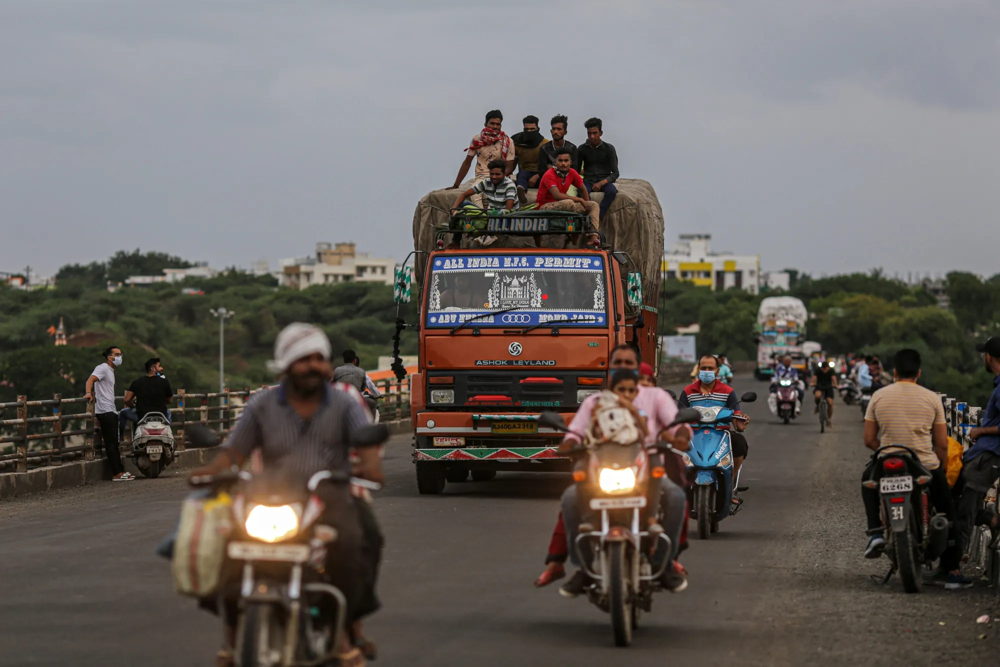

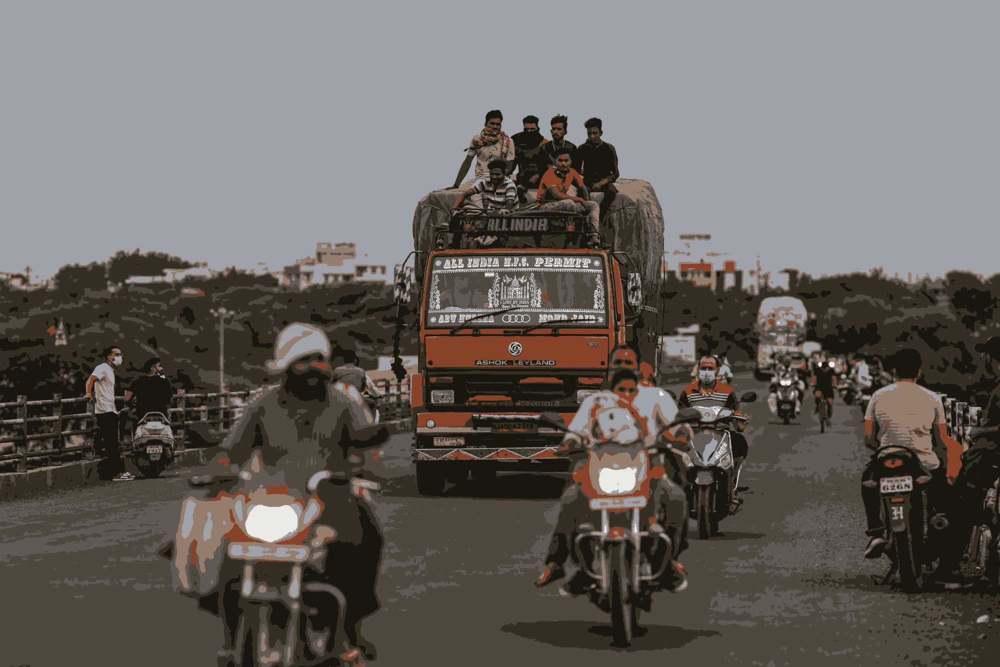

In [22]:
# prompt: = Apply k-means clustering for segmenting regions in an image.

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def kmeans_segmentation(image_path, k=8):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image at {image_path}")
        return

    # Convert the image to a 2D array of pixels
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    # Define criteria for k-means clustering
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    # Apply k-means clustering
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert the cluster centers to 8-bit unsigned integers
    centers = np.uint8(centers)

    # Map the labels to the cluster centers to get the segmented image
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)

    # Display the segmented image
    cv2_imshow(image)
    cv2_imshow(segmented_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage:
kmeans_segmentation('/content/-1x-1.jpg')